In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
import sklearn.preprocessing
from sklearn.model_selection import train_test_split, RandomizedSearchCV
from sklearn import metrics
from scipy.stats import randint
import graphviz
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import cross_val_score
from sklearn.tree import DecisionTreeClassifier, plot_tree

In [ ]:
df = pd.read_csv('/content/application_train.csv')
shap = df.shape
print("Shape of the dataframe (row, col):",shap,"\r\n")


Shape of the dataframe (row, col): (21340, 122) 



In [ ]:
top_ten_variables = ['NAME_CONTRACT_TYPE', 'CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'NAME_EDUCATION_TYPE',
                     'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE', 'OCCUPATION_TYPE', 'HOUSETYPE_MODE', 'CNT_CHILDREN']

In [ ]:
X = df[top_ten_variables]
y = df['TARGET']

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


In [ ]:
categorical_columns = ['NAME_CONTRACT_TYPE', 'CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'NAME_EDUCATION_TYPE',
                     'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE', 'OCCUPATION_TYPE', 'HOUSETYPE_MODE']

In [ ]:
from sklearn.preprocessing import LabelEncoder

label_encoder = LabelEncoder()
X_train_encoded = X_train.copy()
X_test_encoded = X_test.copy()

# Apply label encoding to categorical variables in X_train and X_test
for col in categorical_columns:
    X_train_encoded[col] = label_encoder.fit_transform(X_train[col])
    X_test_encoded[col] = label_encoder.transform(X_test[col])

# **Classification Tree**

In [ ]:
clf = DecisionTreeClassifier()

# Train the decision tree classifier
clf.fit(X_train_encoded, y_train)

DecisionTreeClassifier()

In [ ]:
y_hat = clf.predict(X_train_encoded) # Predict the response for train dataset

y_pred = clf.predict(X_test_encoded) # Predict the response for test dataset

# Compute training and test accuracy
print("Train Accuracy:", metrics.accuracy_score(y_train, y_hat))
print("Test Accuracy:", metrics.accuracy_score(y_test, y_pred))

Train Accuracy: 0.938730084348641
Test Accuracy: 0.8994845360824743


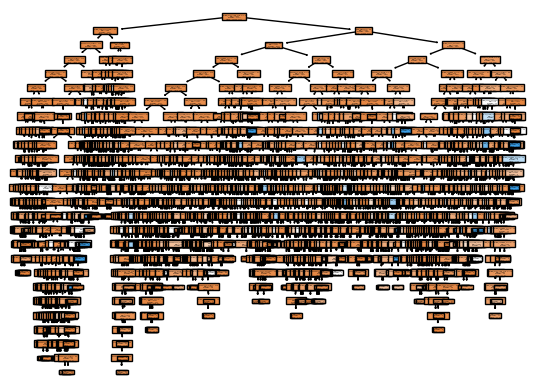

In [ ]:
f_names=list(X.columns) # Feature names
plot_tree(clf, filled=True, feature_names=f_names) # Plot the tree
plt.show() # Show without the rules in plain text

**Pruning**

Train Accuracy: 0.9216846298031866
Test Accuracy: 0.9198687910028116


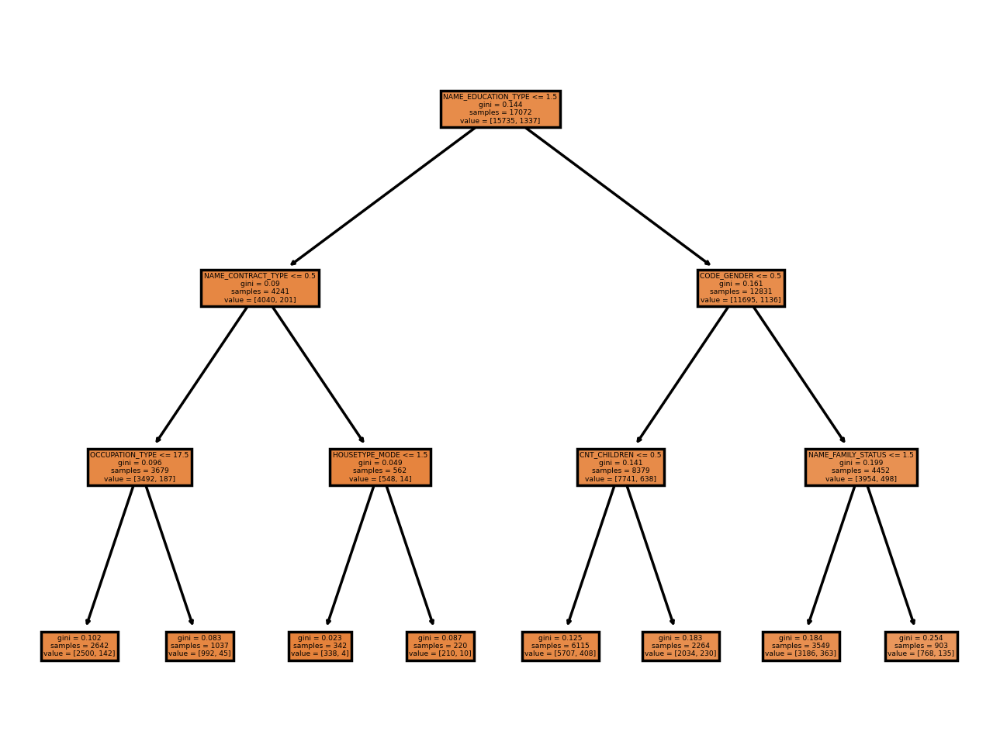

In [ ]:
clf = DecisionTreeClassifier(max_depth=3, min_samples_split=100)

# Train and test the classifier
clf = clf.fit(X_train_encoded, y_train) # Train Decision Tree Classifer
y_hat = clf.predict(X_train_encoded) # Predict the response for train dataset
y_pred = clf.predict(X_test_encoded) # Predict the response for test dataset

# Compute training and test accuracy
print("Train Accuracy:", metrics.accuracy_score(y_train, y_hat))
print("Test Accuracy:", metrics.accuracy_score(y_test, y_pred))

plt.rcParams['figure.dpi'] = 250 # To increase the resolution from 100dpi to 200dpi

# Plot the tree
f_names=list(X.columns) # Feature names
plot_tree(clf, filled=True, feature_names=f_names) # Plot the tree
plt.show() # Show without the rules in plain text

The tree has been pruned to avoid overfitting. The pruned decision tree is visualized above. Education type is at the very top of the tree indicating that it is the best predictor.

**Random** **Forrest**

In [ ]:
rf = RandomForestClassifier(random_state=0) # Create Fandom Forest classifer object
rf = rf.fit(X_train_encoded, y_train) # Train Random Forest Classifer

In [ ]:
y_hat = rf.predict(X_train_encoded) # Predict the response for train dataset

y_pred = rf.predict(X_test_encoded) # Predict the response for test dataset

# Compute training and test accuracy
print("Train Accuracy:", metrics.accuracy_score(y_train, y_hat))
print("Test Accuracy:", metrics.accuracy_score(y_test, y_pred))

Train Accuracy: 0.9216846298031866
Test Accuracy: 0.9198687910028116


In [ ]:
f_names=list(X.columns) # Feature names
fig, axes = plt.subplots(nrows=1, ncols=5, figsize=(10,2), dpi=3000) # Setup the 1x5 grid for ploting the trees
for index in range(0, 5): # Iterate through the first five trees (of 100)
  plot_tree(rf.estimators_[index], feature_names=f_names, filled = True, ax=axes[index]); # Plot the tree
  axes[index].set_title('Estimator: ' + str(index), fontsize = 11) # Print title

# **Pruning**

In [ ]:
rf = RandomForestClassifier(random_state=0, max_depth=4) # Create Fandom Forest classifer object
rf = rf.fit(X_train_encoded, y_train) # Train Random Forest Classifer

In [ ]:
f_names=list(X.columns) # Feature names
fig, axes = plt.subplots(nrows=1, ncols=5, figsize=(10,2), dpi=3000) # Setup the 1x5 grid for ploting the trees
for index in range(0, 5): # Iterate through the first five trees (of 100)
  plot_tree(rf.estimators_[index], feature_names=f_names, filled = True, ax=axes[index]); # Plot the tree
  axes[index].set_title('Estimator: ' + str(index), fontsize = 11) # Print title

The random forrest was created to have a much wider view of the overall predictive performance. They are used as they have better accuracy and the averaging conducted by this model allows for reduction of variance.

# **Comparison**

In [ ]:
numeric_cols = df.select_dtypes(include=[np.number]).columns
correlations = df[numeric_cols].corr()['TARGET'].sort_values()

# Display correlations
print('Most Positive Correlations:\n', correlations.tail(15))
corr= correlations.tail(15)
print('\nMost Negative Correlations:\n', correlations.head(15))

Most Positive Correlations:
 DEF_60_CNT_SOCIAL_CIRCLE       0.031276
DEF_30_CNT_SOCIAL_CIRCLE       0.032248
LIVE_CITY_NOT_WORK_CITY        0.032518
OWN_CAR_AGE                    0.037612
DAYS_REGISTRATION              0.041975
FLAG_DOCUMENT_3                0.044346
REG_CITY_NOT_LIVE_CITY         0.044395
FLAG_EMP_PHONE                 0.045982
REG_CITY_NOT_WORK_CITY         0.050994
DAYS_ID_PUBLISH                0.051457
DAYS_LAST_PHONE_CHANGE         0.055218
REGION_RATING_CLIENT           0.058899
REGION_RATING_CLIENT_W_CITY    0.060893
DAYS_BIRTH                     0.078239
TARGET                         1.000000
Name: TARGET, dtype: float64

Most Negative Correlations:
 EXT_SOURCE_3                 -0.178919
EXT_SOURCE_2                 -0.160472
EXT_SOURCE_1                 -0.155317
DAYS_EMPLOYED                -0.044932
FLOORSMAX_AVG                -0.044003
FLOORSMAX_MEDI               -0.043768
FLOORSMAX_MODE               -0.043226
AMT_GOODS_PRICE              -0.039645


Based on the above correlations, the top-ten variables selected from the variable importance chart are not the same as the ones chosen in the Module 1 Assignment. There is a reason as to why these differences may have occured because the Random Forest considers the interactions and correlations among variables, which can affect the importance ranking.